In [1]:
### Grey Scale로 clustering하기 - Upper_Body

In [96]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

In [97]:
dataset_path = "C:/Users/jonghui/Downloads/DressCode/cloth/upper_body/"

img_list = []
for img in os.listdir(dataset_path):
    if img.endswith("1.jpg"):
        img_list.append(img)

print(img_list)

['000000_1.jpg', '000001_1.jpg', '000002_1.jpg', '000003_1.jpg', '000004_1.jpg', '000005_1.jpg', '000006_1.jpg', '000007_1.jpg', '000008_1.jpg', '000009_1.jpg', '000010_1.jpg', '000011_1.jpg', '000012_1.jpg', '000013_1.jpg', '000014_1.jpg', '000015_1.jpg', '000016_1.jpg', '000017_1.jpg', '000018_1.jpg', '000019_1.jpg', '000020_1.jpg', '000021_1.jpg', '000022_1.jpg', '000023_1.jpg', '000024_1.jpg', '000025_1.jpg', '000026_1.jpg', '000027_1.jpg', '000028_1.jpg', '000029_1.jpg', '000030_1.jpg', '000031_1.jpg', '000032_1.jpg', '000033_1.jpg', '000034_1.jpg', '000035_1.jpg', '000036_1.jpg', '000037_1.jpg', '000038_1.jpg', '000039_1.jpg', '000040_1.jpg', '000041_1.jpg', '000042_1.jpg', '000043_1.jpg', '000044_1.jpg', '000045_1.jpg', '000046_1.jpg', '000047_1.jpg', '000048_1.jpg', '000049_1.jpg', '000050_1.jpg', '000051_1.jpg', '000052_1.jpg', '000053_1.jpg', '000054_1.jpg', '000055_1.jpg', '000056_1.jpg', '000057_1.jpg', '000058_1.jpg', '000059_1.jpg', '000060_1.jpg', '000061_1.jpg', '000062

In [98]:
print(len(img_list))

15363


In [99]:
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

class CustomImageDataset(Dataset):
    def __init__(self, directory, transform=None):
        self.directory = directory
        self.transform = transform
        self.images = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.images[idx])
        # image = Image.open(img_name).convert('RGB')
        image = Image.open(img_name).convert('L') # load image grey scale
        if self.transform:
            image = self.transform(image)
        return image

# Define transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3), # convert to 3 channels
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

dataset = CustomImageDataset(directory=dataset_path, transform=transform)

# Create a DataLoader
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

In [42]:
transform

Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=warn)
    Grayscale(num_output_channels=3)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)

In [100]:
import torch
from torchvision.models import resnet50

# Initialize the pre-trained model
model = resnet50(pretrained=True)
model.eval()  # Set the model to evaluation mode

# Adapt the model to use it as a feature extractor
model = torch.nn.Sequential(*(list(model.children())[:-1]))

if torch.cuda.is_available():
    device = torch.device("cuda")
    print('device: cuda')
else:
    device = torch.device("cpu")
    print('device: cpu')
model = model.to(device)

c:\Users\jonghui\anaconda3\envs\torch_book\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\jonghui\anaconda3\envs\torch_book\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


device: cuda


In [ ]:
# Feature extraction function
def extract_features(dataloader, model, device):
    features = []
    with torch.no_grad():
        for inputs in dataloader:
            inputs = inputs.to(device)  # Move input data to the GPU
            outputs = model(inputs).flatten(start_dim=1)
            features.append(outputs.cpu().numpy())  # Move the tensors back to CPU for numpy conversion
    return np.concatenate(features, axis=0)

# Extract features
features_u = extract_features(dataloader, model, device)

In [6]:
features_u.shape

NameError: name 'features_u' is not defined

In [13]:
#save model
np.save('./features_grey_upper.npy', features_u)

In [101]:
# load model
features_u = np.load('./features_grey_upper.npy')

In [102]:
from sklearn.cluster import KMeans

# Clustering
kmeans_u = KMeans(n_clusters=100, random_state=22) # 100개의 cluster로 나누기
clusters_u = kmeans_u.fit_predict(features_u) # 각 이미지가 어떤 cluster에 속하는지

In [34]:
print(len(clusters_u))
print(clusters_u)
print(len(set(clusters_u)))
clusters_u

15363
[ 3 58 28 ... 76 36 76]
100


array([ 3, 58, 28, ..., 76, 36, 76])

In [107]:
clusters_u = [int(x) for x in clusters_u]

In [104]:
# clusters_u = np.array(clusters_u)
# clusters_u

array([ 3, 58, 28, ..., 76, 36, 76])

In [108]:
cluster_groups = {int(0): []}
                #   , 1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: []}
for i, cluster in enumerate(clusters_u):
    # print(i, cluster)
    if cluster not in cluster_groups:
        cluster_groups[cluster] = []
    
    cluster_groups[cluster].append(img_list[i])

In [109]:
import json

# Save the dictionary to a JSON file
with open('cluster_result.json', 'w') as json_file:
    json.dump(cluster_groups, json_file)

In [110]:
dataset_path = "C:/Users/jonghui/Downloads/DressCode/cloth/upper_body/"
# Load the dictionary back from the JSON file
with open('cluster_result_upper.json', 'r') as json_file:
    cluster_groups = json.load(json_file)

print(cluster_groups)


{'0': ['000058_1.jpg', '000061_1.jpg', '000069_1.jpg', '000088_1.jpg', '000091_1.jpg', '000320_1.jpg', '000388_1.jpg', '000405_1.jpg', '000534_1.jpg', '000616_1.jpg', '000863_1.jpg', '000866_1.jpg', '001240_1.jpg', '002891_1.jpg', '003102_1.jpg', '003202_1.jpg', '003209_1.jpg', '003231_1.jpg', '003246_1.jpg', '003273_1.jpg', '003295_1.jpg', '003340_1.jpg', '006355_1.jpg', '006731_1.jpg', '007220_1.jpg', '007318_1.jpg', '007334_1.jpg', '007385_1.jpg', '007400_1.jpg', '007485_1.jpg', '007494_1.jpg', '007499_1.jpg', '007516_1.jpg', '007544_1.jpg', '007548_1.jpg', '007652_1.jpg', '007667_1.jpg', '007694_1.jpg', '007751_1.jpg', '007777_1.jpg', '007788_1.jpg', '007840_1.jpg', '007853_1.jpg', '007966_1.jpg', '007977_1.jpg', '008049_1.jpg', '008059_1.jpg', '008087_1.jpg', '008096_1.jpg', '008118_1.jpg', '008224_1.jpg', '008243_1.jpg', '008313_1.jpg', '008337_1.jpg', '008955_1.jpg', '009917_1.jpg', '009929_1.jpg', '009943_1.jpg', '010338_1.jpg', '010390_1.jpg', '010480_1.jpg', '010493_1.jpg', '

In [116]:
cluster_groups.keys()

dict_keys(['0', '3', '58', '28', '8', '65', '72', '35', '92', '25', '14', '46', '1', '89', '16', '64', '21', '20', '50', '95', '86', '67', '9', '4', '80', '29', '27', '77', '11', '79', '90', '94', '85', '24', '13', '70', '54', '22', '19', '73', '55', '61', '15', '68', '59', '51', '12', '26', '71', '10', '36', '2', '52', '66', '40', '97', '6', '48', '78', '37', '17', '83', '63', '32', '18', '42', '57', '69', '93', '74', '44', '49', '33', '81', '38', '87', '23', '98', '53', '34', '43', '84', '56', '62', '88', '47', '82', '96', '60', '91', '30', '45', '99', '75', '39', '5', '7', '76', '41', '31'])

In [124]:
def print_cluster_img(num):
    for i in range(15):
        img = plt.imread(dataset_path + cluster_groups[str(num)][i])
        plt.subplot(3, 5, i+1)
        plt.axis('off')
        plt.imshow(img)

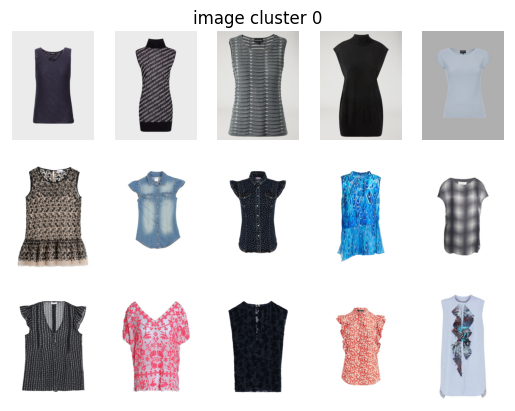

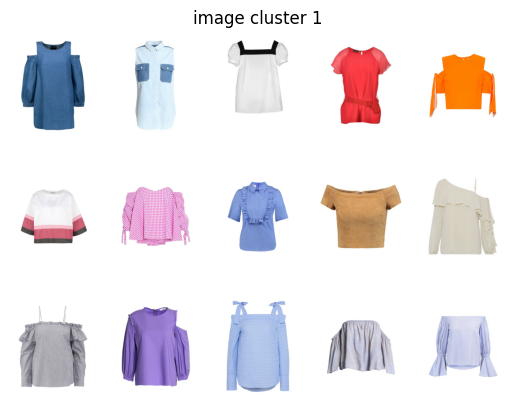

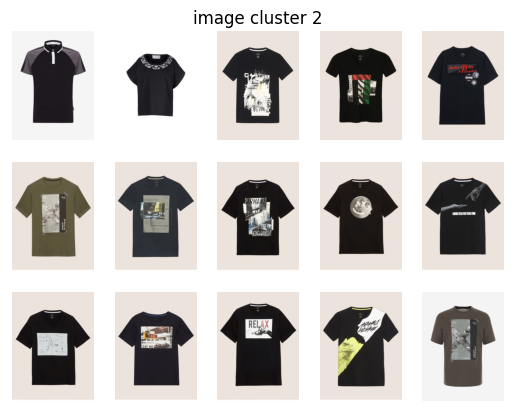

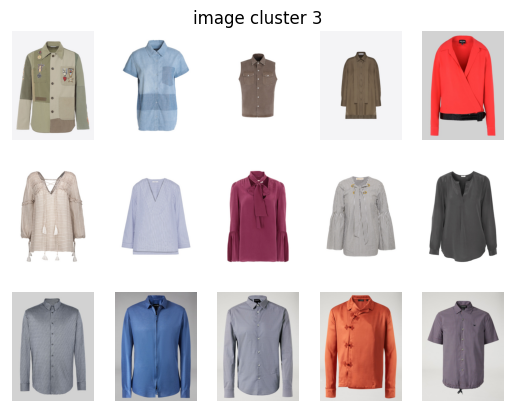

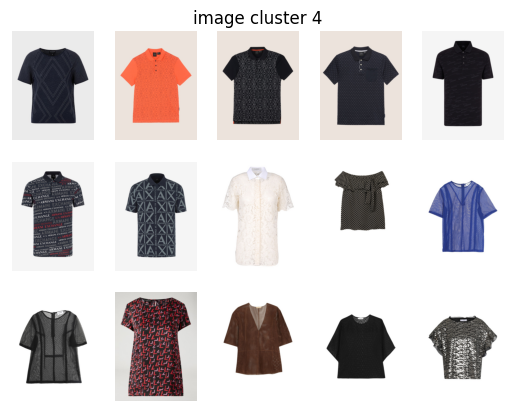

In [125]:
for i in range(5):
    plt.figure()
    plt.axis('off')
    plt.title(f'image cluster {i}')
    print_cluster_img(i)

### Predict

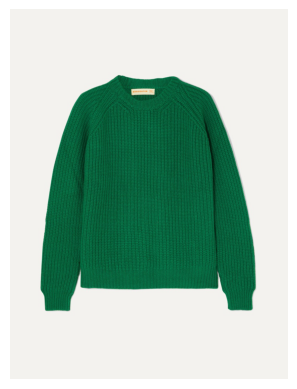

Test Image Cluster: [20]


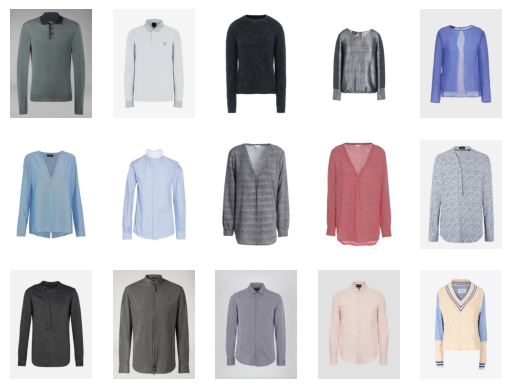

In [126]:
test_img = plt.imread('C:/Users/jonghui/Downloads/DressCode/cloth/upper_body/012973_1.jpg')

test_img_transformed = transform(Image.fromarray(test_img))
test_img_feature = model(test_img_transformed.unsqueeze(0).to(device)).flatten(start_dim=1).detach().cpu().numpy()
# Plot the test image
plt.imshow(test_img)
plt.axis('off')
plt.show()

# Predict the cluster for the test image
test_cluster = kmeans_u.predict(test_img_feature) # predict the cluster number for the test image
print("Test Image Cluster:", test_cluster)

# Plot the images in the same cluster as the test image
print_cluster_img(test_cluster[0])


20

In [127]:
cluster_groups[test_cluster[0]]

KeyError: 20

In [128]:
# 예측 클러스터에 속하는 이미지들의 인덱스를 찾기

# img = plt.imread(dataset_path + cluster_groups[num][i])
        
# cluster_indices = [i for i, cluster_id in enumerate( ) if cluster_id == 5]

# 예측 클러스터에 속하는 이미지들의 파일명을 저장하는 리스트 생성
test_cluster_img_list = cluster_groups[str(test_cluster[0])]

print("test image 클러스터에 속하는 이미지들의 파일명:", test_cluster_img_list)

test_cluster_img_idx_list = [i for i, j in enumerate(img_list) if j in test_cluster_img_list]
test_cluster_img_idx_list # idx list

test image 클러스터에 속하는 이미지들의 파일명: ['000052_1.jpg', '000130_1.jpg', '000345_1.jpg', '000638_1.jpg', '001168_1.jpg', '001526_1.jpg', '001554_1.jpg', '001608_1.jpg', '001609_1.jpg', '001750_1.jpg', '001758_1.jpg', '001773_1.jpg', '001838_1.jpg', '001843_1.jpg', '002000_1.jpg', '002155_1.jpg', '002159_1.jpg', '002206_1.jpg', '002290_1.jpg', '002297_1.jpg', '002627_1.jpg', '003003_1.jpg', '004529_1.jpg', '004632_1.jpg', '005471_1.jpg', '005472_1.jpg', '005589_1.jpg', '005647_1.jpg', '005662_1.jpg', '005668_1.jpg', '005670_1.jpg', '005673_1.jpg', '005676_1.jpg', '005722_1.jpg', '005759_1.jpg', '005760_1.jpg', '005798_1.jpg', '005803_1.jpg', '005807_1.jpg', '005846_1.jpg', '005877_1.jpg', '005929_1.jpg', '005943_1.jpg', '005997_1.jpg', '006006_1.jpg', '006037_1.jpg', '006040_1.jpg', '006045_1.jpg', '006100_1.jpg', '006135_1.jpg', '006140_1.jpg', '006181_1.jpg', '006320_1.jpg', '006392_1.jpg', '006734_1.jpg', '006736_1.jpg', '006745_1.jpg', '006748_1.jpg', '006882_1.jpg', '006924_1.jpg', '006939

[52,
 130,
 345,
 638,
 1168,
 1526,
 1554,
 1608,
 1609,
 1750,
 1758,
 1773,
 1838,
 1843,
 2000,
 2155,
 2159,
 2206,
 2290,
 2297,
 2627,
 3003,
 4529,
 4632,
 5471,
 5472,
 5589,
 5647,
 5662,
 5668,
 5670,
 5673,
 5676,
 5722,
 5759,
 5760,
 5798,
 5803,
 5807,
 5846,
 5877,
 5929,
 5943,
 5997,
 6006,
 6037,
 6040,
 6045,
 6100,
 6135,
 6140,
 6181,
 6320,
 6392,
 6734,
 6736,
 6745,
 6748,
 6882,
 6924,
 6939,
 7048,
 7051,
 7064,
 7121,
 7151,
 7165,
 8412,
 8413,
 8428,
 8442,
 8529,
 8649,
 8650,
 8672,
 8673,
 8674,
 8675,
 8681,
 8686,
 8689,
 8690,
 8691,
 8692,
 8700,
 8725,
 8768,
 8791,
 8793,
 8809,
 8817,
 8830,
 8832,
 8833,
 8851,
 8856,
 8884,
 8885,
 8896,
 8899,
 8910,
 8912,
 8954,
 8975,
 8979,
 8990,
 8996,
 9005,
 9023,
 9031,
 9082,
 9084,
 9118,
 9119,
 9158,
 9226,
 9243,
 9276,
 9277,
 9293,
 9303,
 9305,
 9307,
 9310,
 9311,
 9312,
 9315,
 9318,
 9320,
 9323,
 9324,
 9326,
 9328,
 9332,
 9334,
 9335,
 9341,
 9342,
 9343,
 9344,
 9345,
 9346,
 9348,
 935

In [129]:
import numpy as np
from sklearn.metrics.pairwise import euclidean_distances

reference_feature = test_img_feature  # 기준 이미지의 특징 벡터
cluster_features_u = features_u[test_cluster_img_idx_list]    # test 클러스터 내 모든 이미지의 특징 벡터

# 유클리디안 거리 계산
distances = euclidean_distances(reference_feature, cluster_features_u)[0]
distances.shape

(222,)

In [130]:
# 거리에 따라 index 정렬
sorted_indices = np.argsort(distances)  # 오름차순으로 정렬
print(sorted_indices.shape)
sorted_indices

(222,)


array([189, 111, 181, 203,  16, 154, 219,  33,  99,  95, 221,  38, 182,
        80,   3, 214, 160, 130,  88, 118,  84, 143, 127, 107, 122,  62,
       206, 215,  40, 161,  28,  93, 213, 211, 153, 142, 159,  58,  61,
        41, 123,  92, 145, 138, 129, 126,  25, 105, 146,  89, 140, 155,
       101,  82,  26,  10, 125, 102,  77,   2, 131,  18, 204,  63, 207,
        29,  12,  72, 137,  24, 124,  31, 149, 164, 144,  79, 220,  78,
       191, 157, 209, 167, 136, 190,  76,  86, 104,   6, 109, 185,  97,
       110, 199, 114, 108, 168,   1, 192,  57, 195, 156,  94,  53, 162,
        42,  69,  91,   5,  15, 177,  55, 139,   8, 141,  71, 180, 135,
        51,  60, 120,  52,  74, 165,  17, 198, 151,  68, 150,  66,  98,
        64,  54,  21, 116,  75, 174, 173, 115,  48,  32, 184, 134,  67,
        34,  81,  47,  13,  56, 212,  70, 106, 112, 208,  46,  22,  37,
       216,  30, 187,  90,  83, 113, 117, 152, 172, 121,  96, 166,  50,
       175, 147,  39,   7, 193, 103,  11, 170,  59, 218, 202,  3

In [131]:
test_cluster_img_list = np.array(test_cluster_img_list)
test_cluster_img_list[sorted_indices]  # 거리가 가장 가까운 순서대로 test cluster 내 이미지 정렬한 이미지 리스트

array(['012973_1.jpg', '009084_1.jpg', '012433_1.jpg', '048907_1.jpg',
       '002159_1.jpg', '009383_1.jpg', '049823_1.jpg', '005722_1.jpg',
       '008899_1.jpg', '008856_1.jpg', '050021_1.jpg', '005807_1.jpg',
       '012585_1.jpg', '008689_1.jpg', '000638_1.jpg', '049329_1.jpg',
       '009391_1.jpg', '009324_1.jpg', '008793_1.jpg', '009277_1.jpg',
       '008700_1.jpg', '009350_1.jpg', '009318_1.jpg', '009005_1.jpg',
       '009307_1.jpg', '007051_1.jpg', '048938_1.jpg', '049330_1.jpg',
       '005877_1.jpg', '009468_1.jpg', '005662_1.jpg', '008833_1.jpg',
       '049303_1.jpg', '049282_1.jpg', '009380_1.jpg', '009348_1.jpg',
       '009389_1.jpg', '006882_1.jpg', '007048_1.jpg', '005929_1.jpg',
       '009310_1.jpg', '008832_1.jpg', '009356_1.jpg', '009343_1.jpg',
       '009323_1.jpg', '009315_1.jpg', '005472_1.jpg', '008990_1.jpg',
       '009358_1.jpg', '008809_1.jpg', '009345_1.jpg', '009384_1.jpg',
       '008912_1.jpg', '008691_1.jpg', '005589_1.jpg', '001758_1.jpg',
      

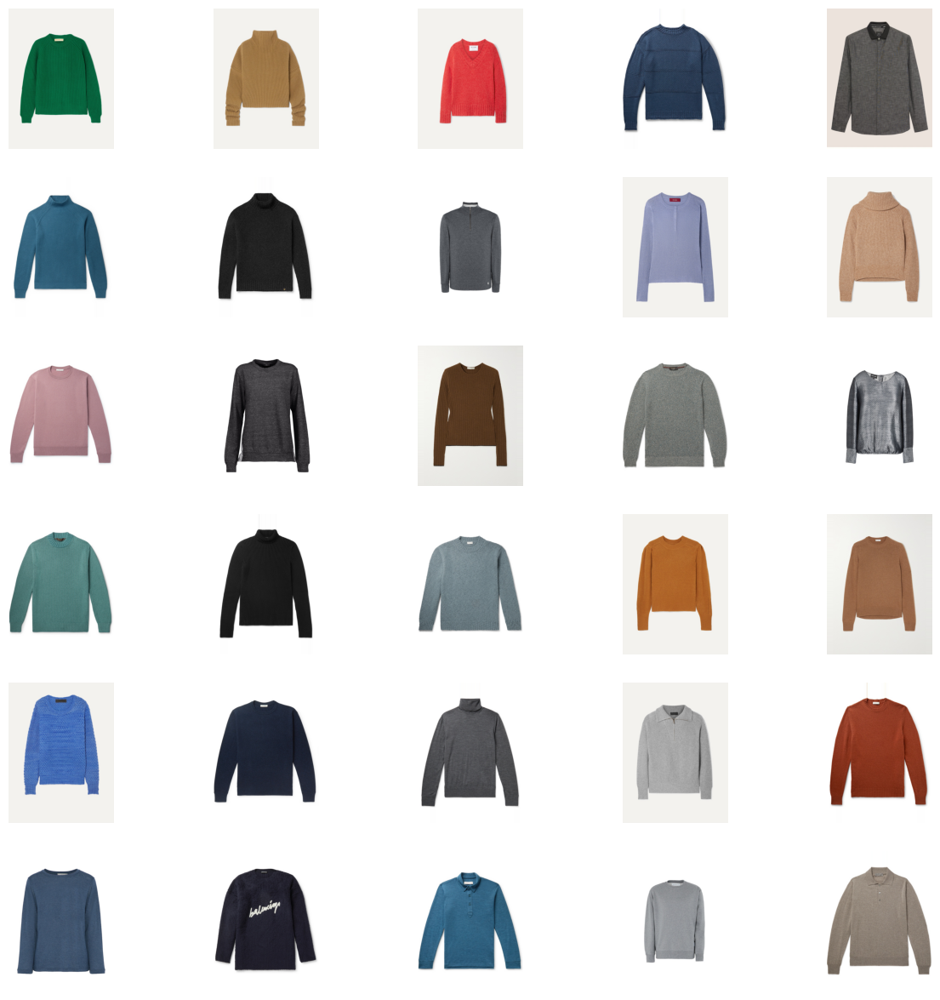

In [132]:
# 정렬된 인덱스를 사용하여 유사한 이미지 순서대로 접근
sorted_images_list = test_cluster_img_list[sorted_indices]

dataset_path = "C:/Users/jonghui/Downloads/DressCode/cloth/upper_body/"
# 결과 사용, 예를 들어 가장 유사한 이미지부터 출력
plt.figure(figsize=(15, 15))
for i in range(30):
    img = plt.imread(dataset_path + sorted_images_list[i])
    plt.subplot(6, 5, i+1)
    plt.axis('off')
    plt.imshow(img)

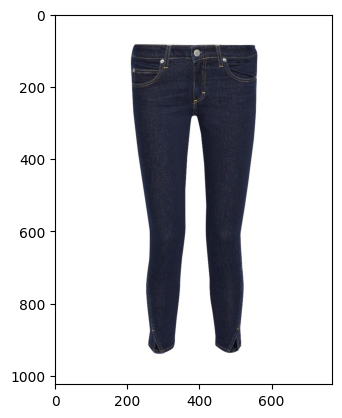

In [51]:
# test_cluster_img_list[sorted_indices][20]
# print(sorted_images_list[19])
# img = plt.imread(dataset_path + sorted_images_list[19])
dataset_path = 'C:/Users/jonghui/Downloads/DressCode/upper_body/images/'
img = plt.imread(dataset_path + '048864_0.jpg')
plt.imshow(img)

dataset_path = 'C:/Users/jonghui/Downloads/DressCode/lower_body/images/'
img = plt.imread(dataset_path + '051889_1.jpg')
plt.imshow(img)

In [ ]:
############################################################################################################

In [ ]:
### Grey Scale로 clustering하기 - Lower_Body

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

In [133]:
dataset_path = "C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/"

img_list = []
for img in os.listdir(dataset_path):
    if img.endswith("1.jpg"):
        img_list.append(img)

print(img_list)

['013563_1.jpg', '013564_1.jpg', '013565_1.jpg', '013566_1.jpg', '013567_1.jpg', '013568_1.jpg', '013569_1.jpg', '013570_1.jpg', '013571_1.jpg', '013572_1.jpg', '013573_1.jpg', '013574_1.jpg', '013575_1.jpg', '013576_1.jpg', '013577_1.jpg', '013578_1.jpg', '013579_1.jpg', '013580_1.jpg', '013581_1.jpg', '013582_1.jpg', '013583_1.jpg', '013584_1.jpg', '013585_1.jpg', '013586_1.jpg', '013587_1.jpg', '013588_1.jpg', '013589_1.jpg', '013590_1.jpg', '013591_1.jpg', '013592_1.jpg', '013593_1.jpg', '013594_1.jpg', '013595_1.jpg', '013596_1.jpg', '013597_1.jpg', '013598_1.jpg', '013599_1.jpg', '013600_1.jpg', '013601_1.jpg', '013602_1.jpg', '013603_1.jpg', '013604_1.jpg', '013605_1.jpg', '013606_1.jpg', '013607_1.jpg', '013608_1.jpg', '013609_1.jpg', '013610_1.jpg', '013611_1.jpg', '013612_1.jpg', '013613_1.jpg', '013614_1.jpg', '013615_1.jpg', '013616_1.jpg', '013617_1.jpg', '013618_1.jpg', '013619_1.jpg', '013620_1.jpg', '013621_1.jpg', '013622_1.jpg', '013623_1.jpg', '013624_1.jpg', '013625

In [134]:
print(len(img_list))

8951


In [135]:
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

class CustomImageDataset(Dataset):
    def __init__(self, directory, transform=None):
        self.directory = directory
        self.transform = transform
        self.images = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.images[idx])
        # image = Image.open(img_name).convert('RGB')
        image = Image.open(img_name).convert('L') # load image grey scale
        if self.transform:
            image = self.transform(image)
        return image

In [ ]:
# Define transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3), # convert to 3 channels
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

dataset = CustomImageDataset(directory=dataset_path, transform=transform)

# Create a DataLoader
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

In [49]:
import torch
from torchvision.models import resnet50

# Initialize the pre-trained model
model = resnet50(pretrained=True)
model.eval()  # Set the model to evaluation mode

# Adapt the model to use it as a feature extractor
model = torch.nn.Sequential(*(list(model.children())[:-1]))

if torch.cuda.is_available():
    device = torch.device("cuda")
    print('device: cuda')
else:
    device = torch.device("cpu")
    print('device: cpu')
model = model.to(device)

# Feature extraction function
def extract_features(dataloader, model, device):
    features = []
    with torch.no_grad():
        for inputs in dataloader:
            inputs = inputs.to(device)  # Move input data to the GPU
            outputs = model(inputs).flatten(start_dim=1)
            features.append(outputs.cpu().numpy())  # Move the tensors back to CPU for numpy conversion
    return np.concatenate(features, axis=0)

# Extract features
features_l = extract_features(dataloader, model, device)

device: cuda


In [8]:
features_l.shape

(8951, 2048)

In [50]:
#save model
np.save('./features_grey_lower.npy', features_l)

In [136]:
import numpy as np
# load model
features_l = np.load('./features_grey_lower.npy')

In [137]:
from sklearn.cluster import KMeans

# Clustering
kmeans_l = KMeans(n_clusters=100, random_state=22)
clusters_l = kmeans_l.fit_predict(features_l)

In [138]:
clusters_l = [int(x) for x in clusters_l]

In [139]:
print(len(clusters_l))
print(clusters_l)
print(len(set(clusters_l)))

8951
[3, 71, 84, 5, 3, 26, 26, 37, 74, 3, 46, 53, 71, 16, 26, 26, 20, 65, 70, 5, 23, 87, 20, 70, 35, 57, 79, 70, 35, 97, 8, 13, 94, 79, 57, 79, 5, 35, 23, 12, 59, 57, 70, 7, 37, 22, 97, 53, 20, 76, 49, 62, 70, 76, 79, 76, 62, 7, 13, 89, 76, 79, 79, 59, 42, 35, 42, 35, 13, 35, 62, 59, 13, 76, 0, 12, 79, 12, 13, 12, 5, 57, 97, 20, 57, 78, 5, 7, 79, 97, 57, 73, 5, 62, 57, 13, 70, 70, 79, 79, 97, 79, 70, 79, 7, 97, 76, 28, 59, 7, 97, 97, 5, 70, 79, 79, 57, 57, 70, 57, 97, 5, 76, 97, 97, 70, 70, 70, 57, 57, 7, 57, 97, 70, 17, 12, 5, 57, 79, 35, 97, 70, 5, 5, 35, 12, 0, 35, 97, 42, 79, 97, 70, 89, 5, 5, 7, 70, 97, 13, 97, 62, 97, 90, 70, 76, 35, 76, 76, 76, 89, 70, 73, 70, 70, 97, 89, 79, 97, 97, 76, 76, 54, 5, 5, 57, 57, 97, 70, 7, 70, 70, 73, 79, 13, 7, 70, 35, 70, 35, 57, 70, 5, 79, 5, 57, 79, 70, 23, 70, 79, 7, 5, 76, 53, 5, 57, 5, 5, 5, 79, 76, 76, 70, 73, 97, 70, 70, 97, 79, 70, 28, 5, 70, 76, 53, 12, 89, 57, 57, 79, 5, 5, 97, 5, 89, 5, 57, 70, 0, 70, 5, 70, 0, 97, 70, 7, 7, 57, 76, 97

In [140]:
cluster_groups = {0: [], 1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: []}
for i, cluster in enumerate(clusters_l):
    # print(i, cluster)
    if cluster not in cluster_groups:
        cluster_groups[cluster] = []
    
    cluster_groups[cluster].append(img_list[i])

In [162]:
cluster_groups

{'0': ['013637_1.jpg',
  '013709_1.jpg',
  '013812_1.jpg',
  '013816_1.jpg',
  '013824_1.jpg',
  '013829_1.jpg',
  '014109_1.jpg',
  '014403_1.jpg',
  '014518_1.jpg',
  '014915_1.jpg',
  '015024_1.jpg',
  '015059_1.jpg',
  '015072_1.jpg',
  '015074_1.jpg',
  '015086_1.jpg',
  '015117_1.jpg',
  '015160_1.jpg',
  '015170_1.jpg',
  '015184_1.jpg',
  '015187_1.jpg',
  '015217_1.jpg',
  '015220_1.jpg',
  '015221_1.jpg',
  '015222_1.jpg',
  '015242_1.jpg',
  '015267_1.jpg',
  '015270_1.jpg',
  '015340_1.jpg',
  '015342_1.jpg',
  '015343_1.jpg',
  '015347_1.jpg',
  '015356_1.jpg',
  '015366_1.jpg',
  '015395_1.jpg',
  '015407_1.jpg',
  '015422_1.jpg',
  '015428_1.jpg',
  '015466_1.jpg',
  '015471_1.jpg',
  '015472_1.jpg',
  '015500_1.jpg',
  '015511_1.jpg',
  '015519_1.jpg',
  '015524_1.jpg',
  '015544_1.jpg',
  '015548_1.jpg',
  '015551_1.jpg',
  '015561_1.jpg',
  '015582_1.jpg',
  '015620_1.jpg',
  '015647_1.jpg',
  '015658_1.jpg',
  '015661_1.jpg',
  '015667_1.jpg',
  '015673_1.jpg',
  '01

In [163]:
import json

# Save the dictionary to a JSON file
with open('cluster_result_lower.json', 'w') as json_file:
    json.dump(cluster_groups, json_file)

In [164]:
# Load the dictionary back from the JSON file
with open('cluster_result_lower.json', 'r') as json_file:
    cluster_groups = json.load(json_file)

print(cluster_groups)

{'0': ['013637_1.jpg', '013709_1.jpg', '013812_1.jpg', '013816_1.jpg', '013824_1.jpg', '013829_1.jpg', '014109_1.jpg', '014403_1.jpg', '014518_1.jpg', '014915_1.jpg', '015024_1.jpg', '015059_1.jpg', '015072_1.jpg', '015074_1.jpg', '015086_1.jpg', '015117_1.jpg', '015160_1.jpg', '015170_1.jpg', '015184_1.jpg', '015187_1.jpg', '015217_1.jpg', '015220_1.jpg', '015221_1.jpg', '015222_1.jpg', '015242_1.jpg', '015267_1.jpg', '015270_1.jpg', '015340_1.jpg', '015342_1.jpg', '015343_1.jpg', '015347_1.jpg', '015356_1.jpg', '015366_1.jpg', '015395_1.jpg', '015407_1.jpg', '015422_1.jpg', '015428_1.jpg', '015466_1.jpg', '015471_1.jpg', '015472_1.jpg', '015500_1.jpg', '015511_1.jpg', '015519_1.jpg', '015524_1.jpg', '015544_1.jpg', '015548_1.jpg', '015551_1.jpg', '015561_1.jpg', '015582_1.jpg', '015620_1.jpg', '015647_1.jpg', '015658_1.jpg', '015661_1.jpg', '015667_1.jpg', '015673_1.jpg', '015682_1.jpg', '015715_1.jpg', '015726_1.jpg', '015730_1.jpg', '015740_1.jpg', '015801_1.jpg', '015820_1.jpg', '

In [142]:
def print_cluster_img(num):
    for i in range(15):
        img = plt.imread(dataset_path + cluster_groups[str(num)][i])
        plt.subplot(3, 5, i+1)
        plt.axis('off')
        plt.imshow(img)

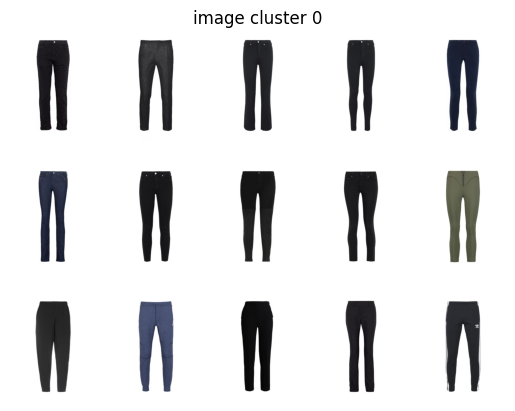

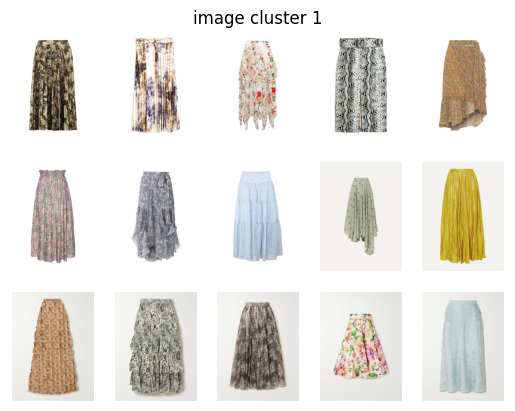

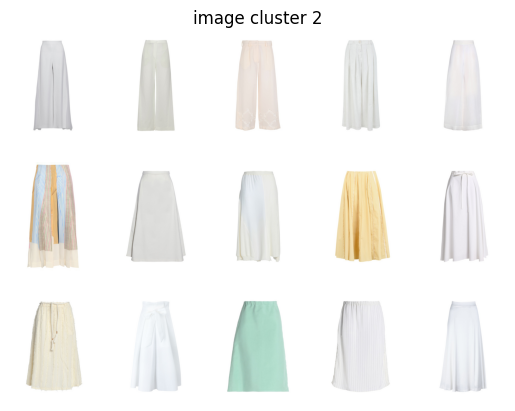

In [143]:
for i in range(3):
    plt.figure()
    plt.axis('off')
    plt.title(f'image cluster {i}')
    print_cluster_img(i)

### Predict

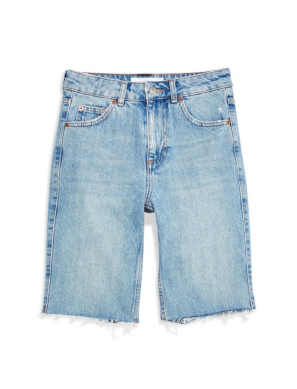

Test Image Cluster: [46]


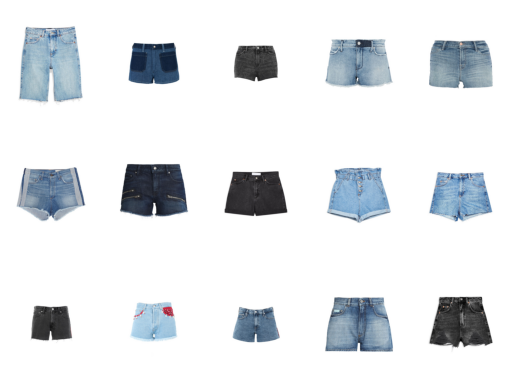

In [151]:
test_img = plt.imread('C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013573_1.jpg')

test_img_transformed = transform(Image.fromarray(test_img))
test_img_feature = model(test_img_transformed.unsqueeze(0).to(device)).flatten(start_dim=1).detach().cpu().numpy()
# Plot the test image
plt.imshow(test_img)
plt.axis('off')
plt.show()

# Predict the cluster for the test image
test_cluster = kmeans_l.predict(test_img_feature) # predict the cluster number for the test image
print("Test Image Cluster:", test_cluster)

# Plot the images in the same cluster as the test image
print_cluster_img(test_cluster[0])


In [152]:
cluster_groups[str(test_cluster[0])]

['013573_1.jpg',
 '014740_1.jpg',
 '014744_1.jpg',
 '014751_1.jpg',
 '014754_1.jpg',
 '014755_1.jpg',
 '014756_1.jpg',
 '014757_1.jpg',
 '014758_1.jpg',
 '014759_1.jpg',
 '014761_1.jpg',
 '014764_1.jpg',
 '014765_1.jpg',
 '014766_1.jpg',
 '014768_1.jpg',
 '014769_1.jpg',
 '014772_1.jpg',
 '014778_1.jpg',
 '014785_1.jpg',
 '014786_1.jpg',
 '014792_1.jpg',
 '014804_1.jpg',
 '014811_1.jpg',
 '014840_1.jpg',
 '014843_1.jpg',
 '014844_1.jpg',
 '014847_1.jpg',
 '014849_1.jpg',
 '014887_1.jpg',
 '017009_1.jpg',
 '017770_1.jpg',
 '018069_1.jpg',
 '018154_1.jpg',
 '018164_1.jpg',
 '018221_1.jpg',
 '018335_1.jpg',
 '018339_1.jpg',
 '018370_1.jpg',
 '018374_1.jpg',
 '018416_1.jpg',
 '018714_1.jpg',
 '018728_1.jpg',
 '018947_1.jpg',
 '018951_1.jpg',
 '018960_1.jpg',
 '020400_1.jpg',
 '020417_1.jpg',
 '020432_1.jpg',
 '020443_1.jpg',
 '020455_1.jpg',
 '020458_1.jpg',
 '020470_1.jpg',
 '020473_1.jpg',
 '020483_1.jpg',
 '020493_1.jpg',
 '020507_1.jpg',
 '020511_1.jpg',
 '020512_1.jpg',
 '020532_1.jpg

In [153]:
# 예측 클러스터에 속하는 이미지들의 인덱스를 찾기

# img = plt.imread(dataset_path + cluster_groups[num][i])
        
# cluster_indices = [i for i, cluster_id in enumerate( ) if cluster_id == 5]

# 예측 클러스터에 속하는 이미지들의 파일명을 저장하는 리스트 생성
test_cluster_img_list = cluster_groups[str(test_cluster[0])]

print("test image 클러스터에 속하는 이미지들의 파일명:", test_cluster_img_list)

test_cluster_img_idx_list = [i for i, j in enumerate(img_list) if j in test_cluster_img_list]
test_cluster_img_idx_list # idx list

test image 클러스터에 속하는 이미지들의 파일명: ['013573_1.jpg', '014740_1.jpg', '014744_1.jpg', '014751_1.jpg', '014754_1.jpg', '014755_1.jpg', '014756_1.jpg', '014757_1.jpg', '014758_1.jpg', '014759_1.jpg', '014761_1.jpg', '014764_1.jpg', '014765_1.jpg', '014766_1.jpg', '014768_1.jpg', '014769_1.jpg', '014772_1.jpg', '014778_1.jpg', '014785_1.jpg', '014786_1.jpg', '014792_1.jpg', '014804_1.jpg', '014811_1.jpg', '014840_1.jpg', '014843_1.jpg', '014844_1.jpg', '014847_1.jpg', '014849_1.jpg', '014887_1.jpg', '017009_1.jpg', '017770_1.jpg', '018069_1.jpg', '018154_1.jpg', '018164_1.jpg', '018221_1.jpg', '018335_1.jpg', '018339_1.jpg', '018370_1.jpg', '018374_1.jpg', '018416_1.jpg', '018714_1.jpg', '018728_1.jpg', '018947_1.jpg', '018951_1.jpg', '018960_1.jpg', '020400_1.jpg', '020417_1.jpg', '020432_1.jpg', '020443_1.jpg', '020455_1.jpg', '020458_1.jpg', '020470_1.jpg', '020473_1.jpg', '020483_1.jpg', '020493_1.jpg', '020507_1.jpg', '020511_1.jpg', '020512_1.jpg', '020532_1.jpg', '020545_1.jpg', '020564

[10,
 1177,
 1181,
 1188,
 1191,
 1192,
 1193,
 1194,
 1195,
 1196,
 1198,
 1201,
 1202,
 1203,
 1205,
 1206,
 1209,
 1215,
 1222,
 1223,
 1229,
 1241,
 1248,
 1277,
 1280,
 1281,
 1284,
 1286,
 1324,
 3446,
 4207,
 4506,
 4591,
 4601,
 4658,
 4772,
 4776,
 4807,
 4811,
 4853,
 5151,
 5165,
 5384,
 5388,
 5397,
 6837,
 6854,
 6869,
 6880,
 6892,
 6895,
 6907,
 6910,
 6920,
 6930,
 6944,
 6948,
 6949,
 6969,
 6982,
 7001,
 7003,
 7007,
 7019,
 7020,
 7040,
 7332,
 7386,
 7863,
 7906,
 7914,
 7916,
 7920,
 8099,
 8152,
 8210,
 8839,
 8851,
 8852,
 8874,
 8906]

In [158]:
import numpy as np
from sklearn.metrics.pairwise import euclidean_distances

reference_feature = test_img_feature  # 기준 이미지의 특징 벡터
cluster_features_l = features_l[test_cluster_img_idx_list]    # test 클러스터 내 모든 이미지의 특징 벡터

# 유클리디안 거리 계산
distances = euclidean_distances(reference_feature, cluster_features_l)[0]
distances.shape

(81,)

In [159]:
# 거리에 따라 index 정렬
sorted_indices = np.argsort(distances)  # 오름차순으로 정렬
print(sorted_indices.shape)
sorted_indices

(81,)


array([ 0, 17, 64, 46, 76, 13, 79, 67, 18,  7, 16,  6, 61, 40, 29, 51,  5,
       54, 57, 39,  9, 41, 25, 55, 56, 38, 60,  1, 15,  4, 23, 52, 10, 58,
       59, 19, 22, 35, 24, 77, 45, 49, 14, 50, 48,  2, 33, 34,  8, 47, 53,
       69, 68, 80, 66, 20, 30, 78, 74, 12, 32, 73, 31, 26, 11, 71, 28, 72,
        3, 63, 62, 36, 21, 37, 75, 65, 43, 42, 27, 44, 70], dtype=int64)

In [160]:
test_cluster_img_list = np.array(test_cluster_img_list)
test_cluster_img_list[sorted_indices]  # 거리가 가장 가까운 순서대로 test cluster 내 이미지 정렬한 이미지 리스트

array(['013573_1.jpg', '014778_1.jpg', '020583_1.jpg', '020417_1.jpg',
       '051880_1.jpg', '014766_1.jpg', '051915_1.jpg', '050427_1.jpg',
       '014785_1.jpg', '014757_1.jpg', '014772_1.jpg', '014756_1.jpg',
       '020566_1.jpg', '018714_1.jpg', '017009_1.jpg', '020470_1.jpg',
       '014755_1.jpg', '020493_1.jpg', '020512_1.jpg', '018416_1.jpg',
       '014759_1.jpg', '018728_1.jpg', '014844_1.jpg', '020507_1.jpg',
       '020511_1.jpg', '018374_1.jpg', '020564_1.jpg', '014740_1.jpg',
       '014769_1.jpg', '014754_1.jpg', '014840_1.jpg', '020473_1.jpg',
       '014761_1.jpg', '020532_1.jpg', '020545_1.jpg', '014786_1.jpg',
       '014811_1.jpg', '018335_1.jpg', '014843_1.jpg', '051892_1.jpg',
       '020400_1.jpg', '020455_1.jpg', '014768_1.jpg', '020458_1.jpg',
       '020443_1.jpg', '014744_1.jpg', '018164_1.jpg', '018221_1.jpg',
       '014758_1.jpg', '020432_1.jpg', '020483_1.jpg', '050947_1.jpg',
       '050904_1.jpg', '051947_1.jpg', '050373_1.jpg', '014792_1.jpg',
      

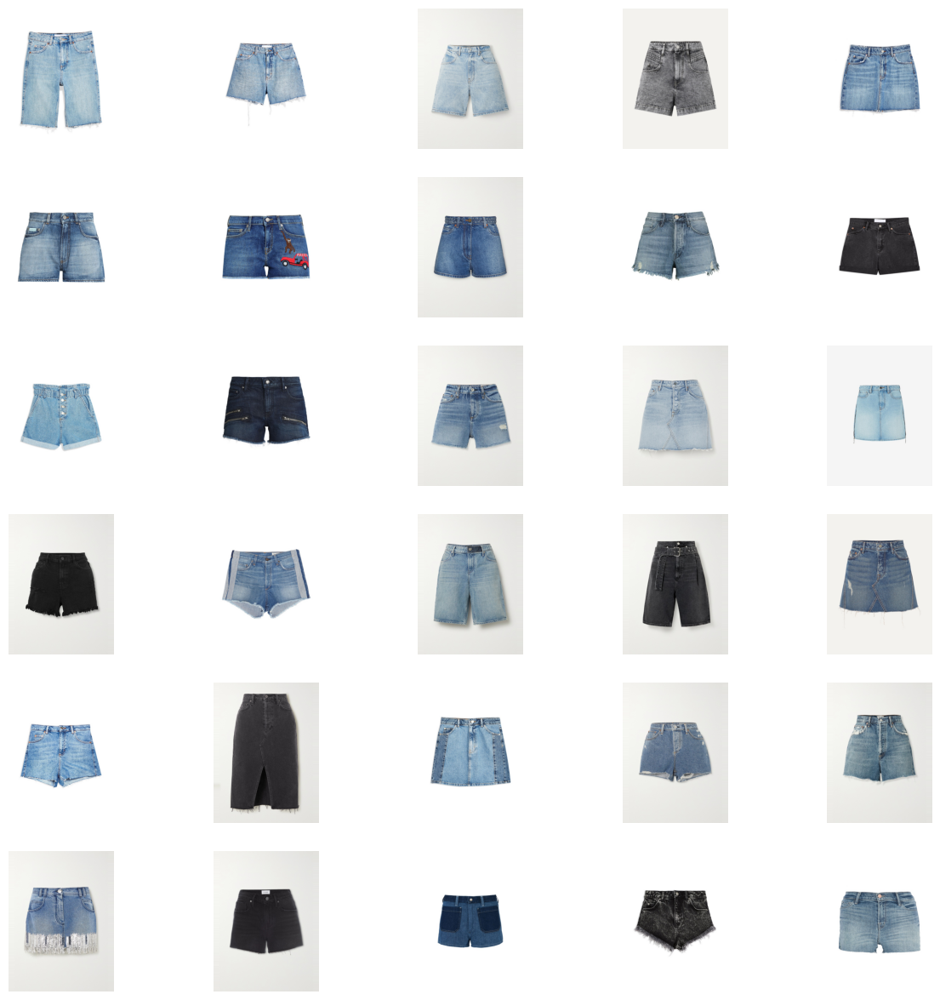

In [161]:
# 정렬된 인덱스를 사용하여 유사한 이미지 순서대로 접근
sorted_images_list = test_cluster_img_list[sorted_indices]

dataset_path = "C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/"
# 결과 사용, 예를 들어 가장 유사한 이미지부터 출력
plt.figure(figsize=(15, 15))
for i in range(30):
    img = plt.imread(dataset_path + sorted_images_list[i])
    plt.subplot(6, 5, i+1)
    plt.axis('off')
    plt.imshow(img)

In [165]:
sorted_images_list[19]

'018416_1.jpg'

In [ ]:
### Grey Scale로 clustering하기 - Lower_Body with Model image

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

In [ ]:
dataset_path = "C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/"

img_list = []
for img in os.listdir(dataset_path):
    if img.endswith("1.jpg"):
        img_list.append(img)

print(img_list)

['013563_1.jpg', '013564_1.jpg', '013565_1.jpg', '013566_1.jpg', '013567_1.jpg', '013568_1.jpg', '013569_1.jpg', '013570_1.jpg', '013571_1.jpg', '013572_1.jpg', '013573_1.jpg', '013574_1.jpg', '013575_1.jpg', '013576_1.jpg', '013577_1.jpg', '013578_1.jpg', '013579_1.jpg', '013580_1.jpg', '013581_1.jpg', '013582_1.jpg', '013583_1.jpg', '013584_1.jpg', '013585_1.jpg', '013586_1.jpg', '013587_1.jpg', '013588_1.jpg', '013589_1.jpg', '013590_1.jpg', '013591_1.jpg', '013592_1.jpg', '013593_1.jpg', '013594_1.jpg', '013595_1.jpg', '013596_1.jpg', '013597_1.jpg', '013598_1.jpg', '013599_1.jpg', '013600_1.jpg', '013601_1.jpg', '013602_1.jpg', '013603_1.jpg', '013604_1.jpg', '013605_1.jpg', '013606_1.jpg', '013607_1.jpg', '013608_1.jpg', '013609_1.jpg', '013610_1.jpg', '013611_1.jpg', '013612_1.jpg', '013613_1.jpg', '013614_1.jpg', '013615_1.jpg', '013616_1.jpg', '013617_1.jpg', '013618_1.jpg', '013619_1.jpg', '013620_1.jpg', '013621_1.jpg', '013622_1.jpg', '013623_1.jpg', '013624_1.jpg', '013625

In [ ]:
print(len(img_list))

8951


In [ ]:
import os
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

class CustomImageDataset(Dataset):
    def __init__(self, directory, transform=None):
        self.directory = directory
        self.transform = transform
        self.images = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = os.path.join(self.directory, self.images[idx])
        # image = Image.open(img_name).convert('RGB')
        image = Image.open(img_name).convert('L') # load image grey scale
        if self.transform:
            image = self.transform(image)
        return image

# Define transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3), # convert to 3 channels
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

dataset = CustomImageDataset(directory=dataset_path, transform=transform)

# Create a DataLoader
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

In [ ]:
import torch
from torchvision.models import resnet50

# Initialize the pre-trained model
model = resnet50(pretrained=True)
model.eval()  # Set the model to evaluation mode

# Adapt the model to use it as a feature extractor
model = torch.nn.Sequential(*(list(model.children())[:-1]))

if torch.cuda.is_available():
    device = torch.device("cuda")
    print('device: cuda')
else:
    device = torch.device("cpu")
    print('device: cpu')
model = model.to(device)

# Feature extraction function
def extract_features(dataloader, model, device):
    features = []
    with torch.no_grad():
        for inputs in dataloader:
            inputs = inputs.to(device)  # Move input data to the GPU
            outputs = model(inputs).flatten(start_dim=1)
            features.append(outputs.cpu().numpy())  # Move the tensors back to CPU for numpy conversion
    return np.concatenate(features, axis=0)

# Extract features
features_l = extract_features(dataloader, model, device)

c:\Users\jonghui\anaconda3\envs\torch_book\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\jonghui\anaconda3\envs\torch_book\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


device: cuda


In [ ]:
features_l.shape

(8951, 2048)

In [ ]:
#save model
np.save('./features_grey_lower.npy', features_l)

In [33]:
import numpy as np
# load model
features_l = np.load('./features_grey_lower.npy')

In [34]:
from sklearn.cluster import KMeans

# Clustering
kmeans_l = KMeans(n_clusters=150, random_state=22)
clusters_l = kmeans_l.fit_predict(features_l)

In [35]:
print(len(clusters_l))
print(clusters_l)
print(len(set(clusters_l)))

8951
[  8 145  85 ...  66  87  58]
150


In [36]:
cluster_groups = {0: [], 1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: []}
for i, cluster in enumerate(clusters_l):
    # print(i, cluster)
    if cluster not in cluster_groups:
        cluster_groups[cluster] = []
    
    cluster_groups[cluster].append(img_list[i])

In [37]:
def print_cluster_img(num):
    for i in range(15):
        img = plt.imread(dataset_path + cluster_groups[num][i])
        plt.subplot(3, 5, i+1)
        plt.axis('off')
        plt.imshow(img)

C:\Users\jonghui\AppData\Local\Temp\ipykernel_288\1804572213.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


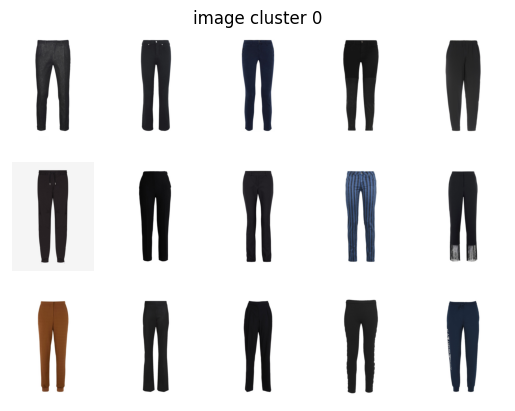

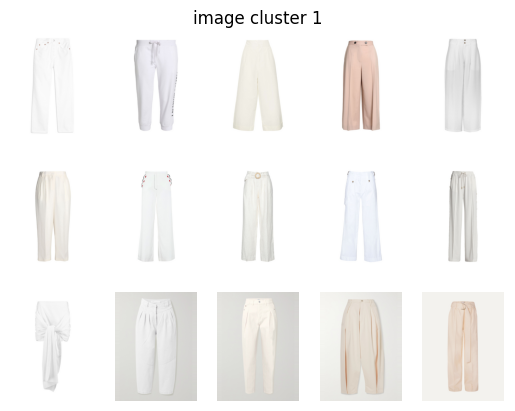

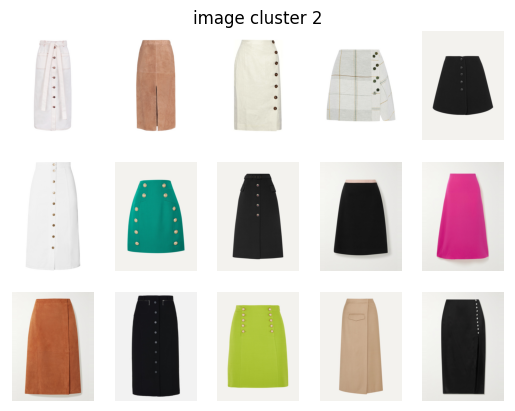

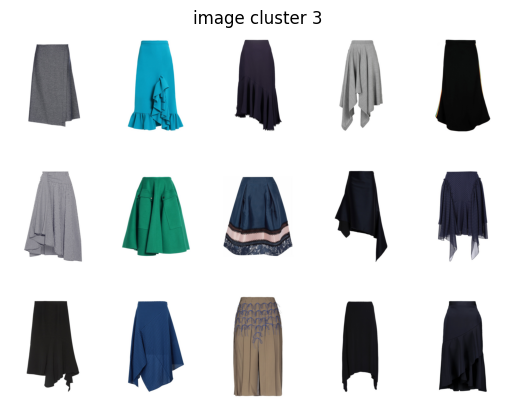

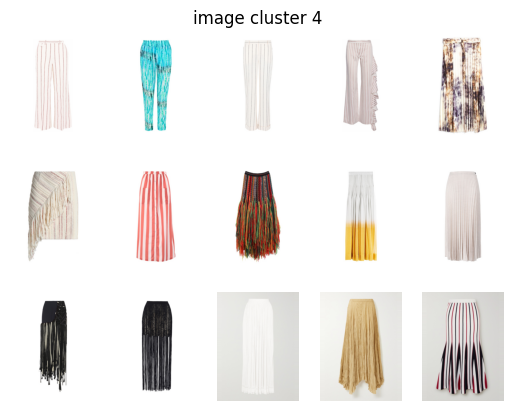

...

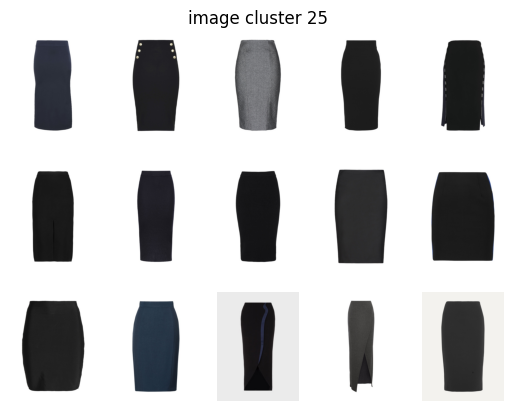

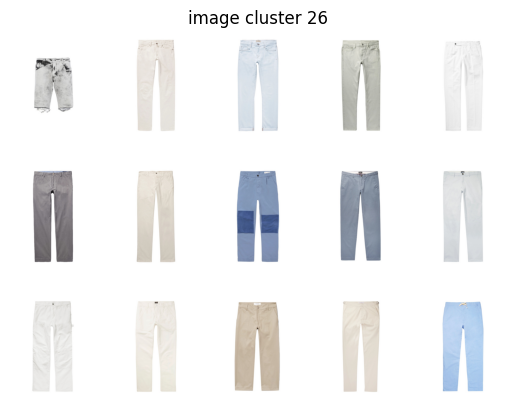

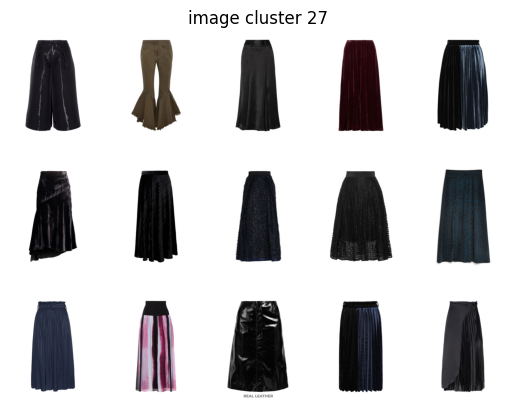

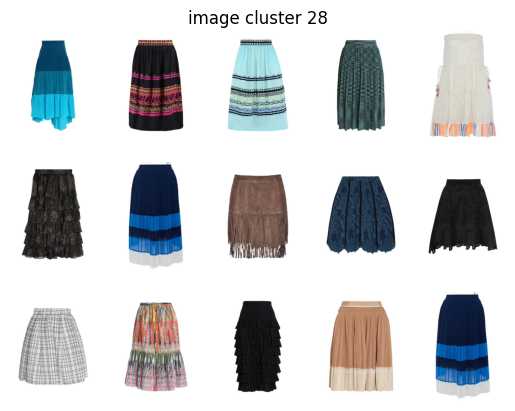

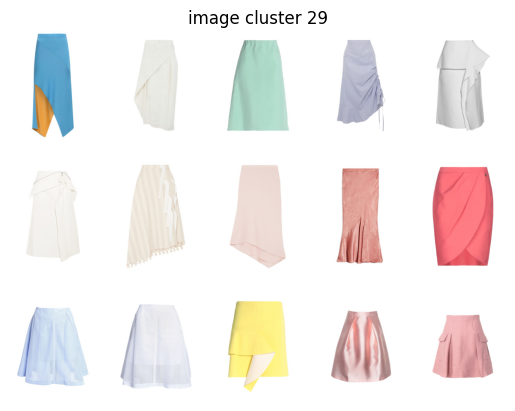

In [31]:
for i in range(30):
    plt.figure()
    plt.axis('off')
    plt.title(f'image cluster {i}')
    print_cluster_img(i)

C:\Users\jonghui\AppData\Local\Temp\ipykernel_288\2948495463.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


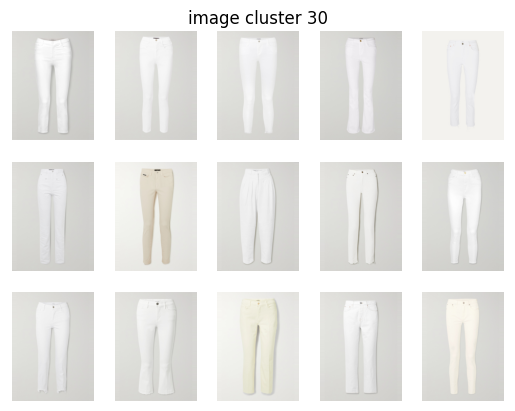

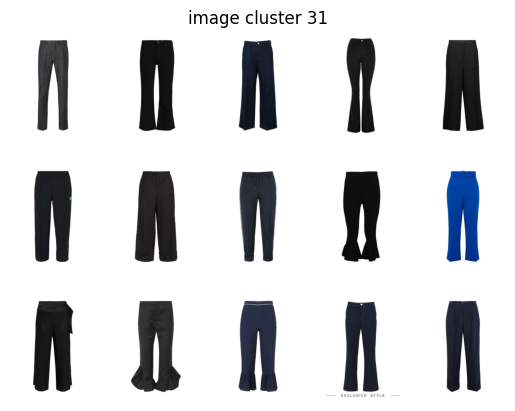

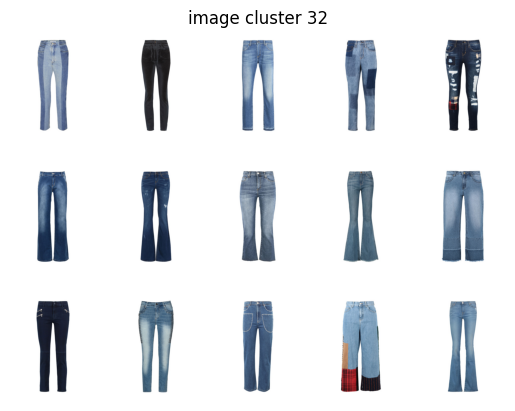

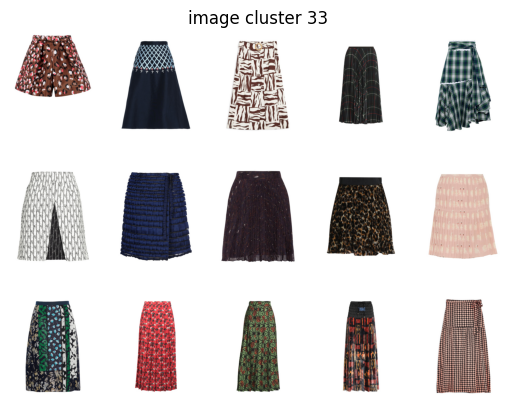

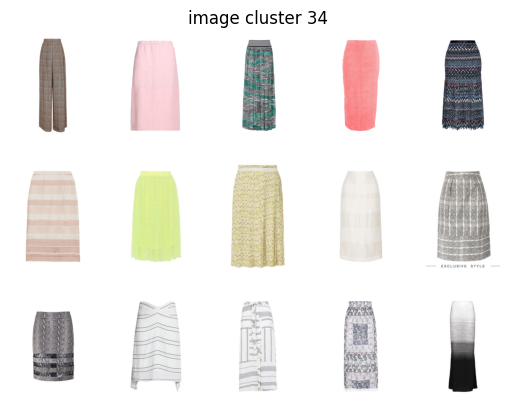

...

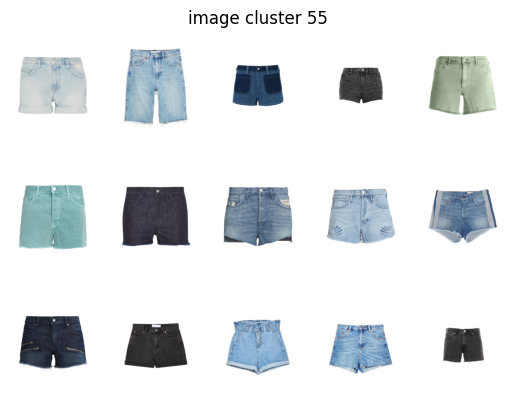

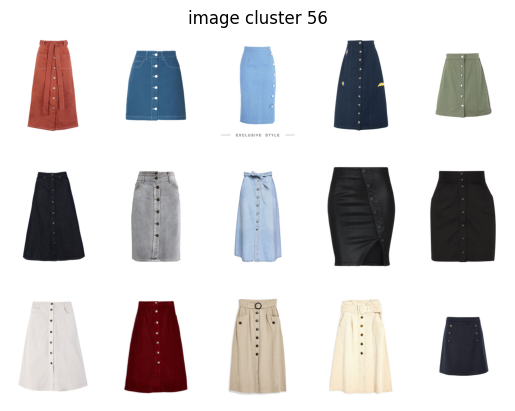

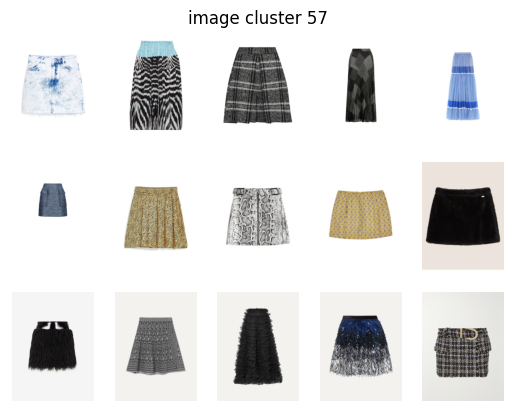

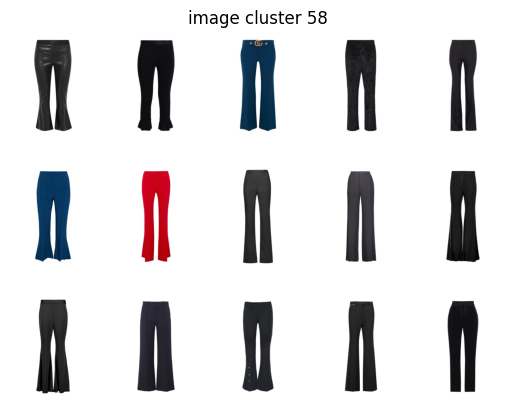

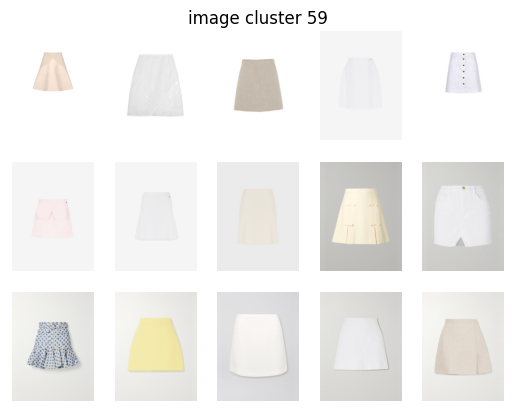

In [38]:
for i in range(30,60):
    plt.figure()
    plt.axis('off')
    plt.title(f'image cluster {i}')
    print_cluster_img(i)

In [ ]:
### 다른 코드

In [32]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import numpy as np
from sklearn.cluster import KMeans

# 사전 학습된 ResNet 모델을 사용하여 특징 추출
class FeatureExtractor(torch.nn.Module):
    def __init__(self):
        super(FeatureExtractor, self).__init__()
        # ResNet 모델 불러오기
        self.model = models.resnet18(pretrained=True)
        # 모델의 마지막 층 제거
        self.model = torch.nn.Sequential(*(list(self.model.children())[:-1]))
        
    def forward(self, x):
        x = self.model(x)
        x = x.view(x.size(0), -1)
        return x

# 옷 사진 데이터셋
class ClothesDataset(Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path)
        if self.transform:
            image = self.transform(image)
        return image

# 데이터셋 로드 및 전처리
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

dataset_path = "C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/"

img_paths = [] # 이미지 경로 리스트
for img in os.listdir(dataset_path):
    if img.endswith("1.jpg"):
        img_paths.append(dataset_path + img)

print(img_paths)

# image_paths = ['path/to/image1.jpg', 'path/to/image2.jpg', '...']  
dataset = ClothesDataset(img_paths, transform)
dataloader = DataLoader(dataset, batch_size=32, shuffle=False)

# 특징 추출
feature_extractor = FeatureExtractor().eval()  # 평가 모드로 설정
features_l2 = []
for images in dataloader:
    with torch.no_grad():
        output = feature_extractor(images)
    features_l2.append(output.cpu().numpy())

features_l2 = np.vstack(features_l2)

# K-means 클러스터링
n_clusters = 40  # 클러스터의 수
kmeans_l2 = KMeans(n_clusters=n_clusters, random_state=0).fit(features_l2)
labels = kmeans_l2.labels_

# Extract features
features_l2 = extract_features(dataloader, model, device)

# Clustering
kmeans_l2 = KMeans(n_clusters=150, random_state=22)
clusters_l2 = kmeans_l2.fit_predict(features_l2)


['C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013563_1.jpg', 'C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013564_1.jpg', 'C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013565_1.jpg', 'C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013566_1.jpg', 'C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013567_1.jpg', 'C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013568_1.jpg', 'C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013569_1.jpg', 'C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013570_1.jpg', 'C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013571_1.jpg', 'C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013572_1.jpg', 'C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013573_1.jpg', 'C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013574_1.jpg', 'C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013575_1.jpg', 'C:/Users/jonghui/Downloads/DressCode/cloth/lower_body/013576_1.jpg', 'C:/Users/jonghui/D

c:\Users\jonghui\anaconda3\envs\torch_book\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\jonghui\anaconda3\envs\torch_book\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


NameError: name 'extract_features' is not defined

In [ ]:
#save model
np.save('./features_grey_lower2.npy', features_l2)

In [ ]:
# load model
features_l2 = np.load('./features_grey_lower2.npy')

In [ ]:
cluster_groups = {0: [], 1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: []}
for i, cluster in enumerate(clusters_l2):
    # print(i, cluster)
    if cluster not in cluster_groups:
        cluster_groups[cluster] = []
    
    cluster_groups[cluster].append(img_list[i])

In [ ]:
def print_cluster_img(num):
    for i in range(15):
        img = plt.imread(dataset_path + cluster_groups[num][i])
        plt.subplot(3, 5, i+1)
        plt.axis('off')
        plt.imshow(img)

C:\Users\jonghui\AppData\Local\Temp\ipykernel_288\1804572213.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


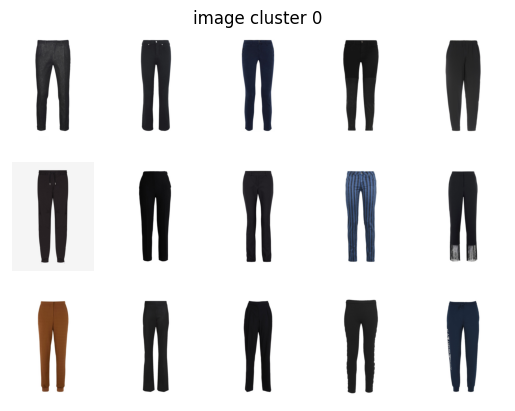

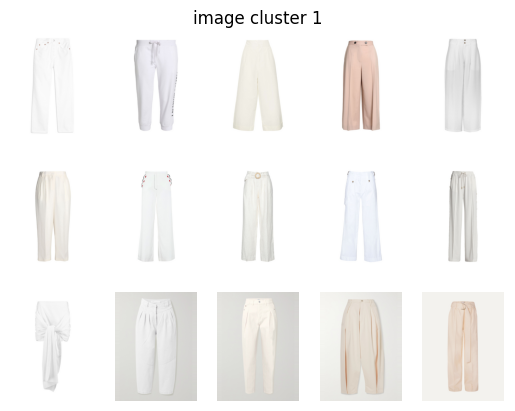

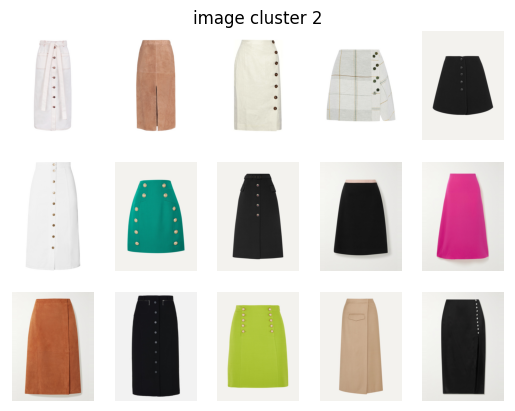

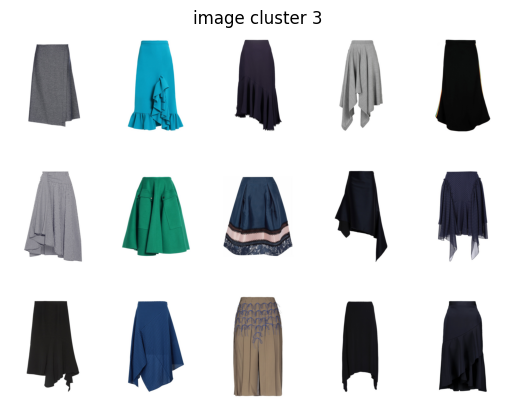

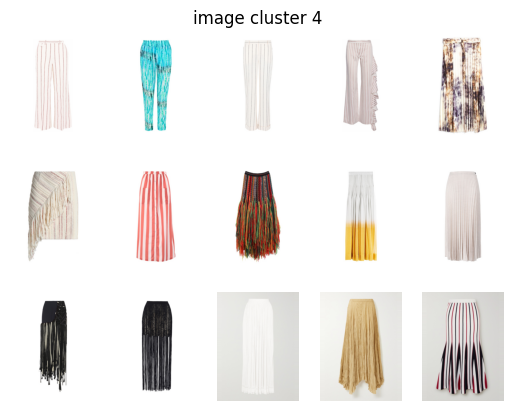

...

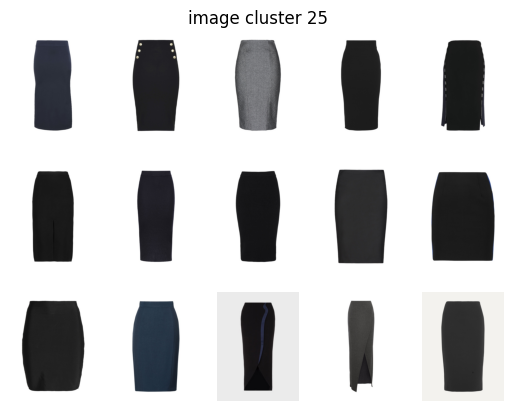

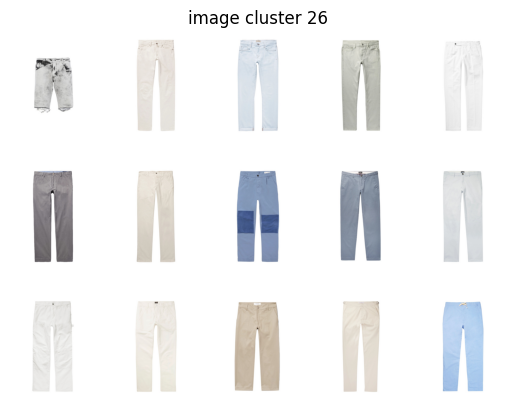

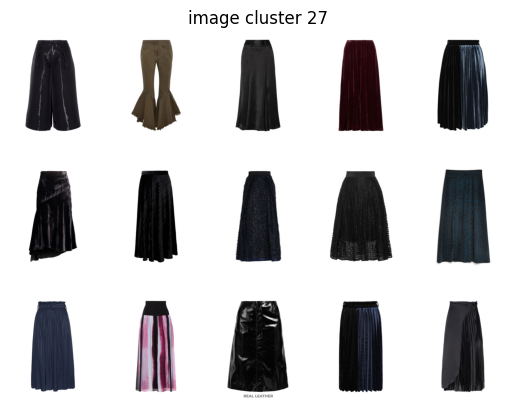

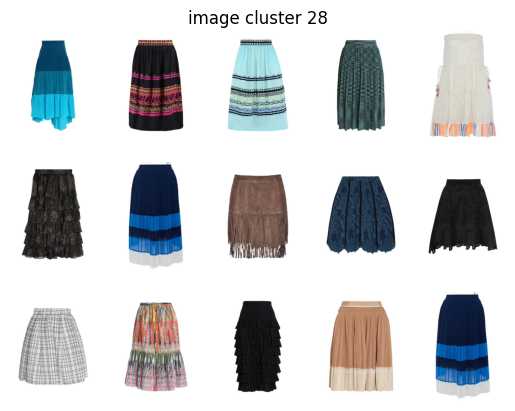

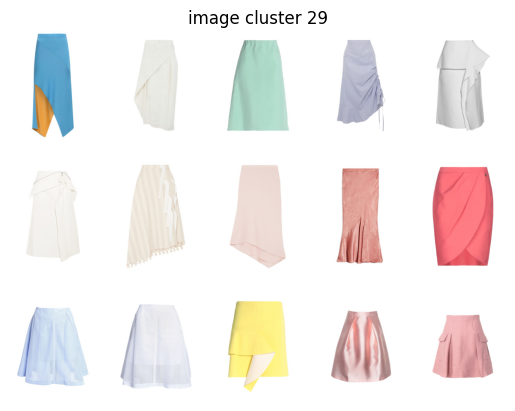

In [ ]:
for i in range(30):
    plt.figure()
    plt.axis('off')
    plt.title(f'image cluster {i}')
    print_cluster_img(i)